In [68]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pandas.tseries.holiday import USFederalHolidayCalendar
from IPython.display import Markdown, display

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX

from pmdarima import auto_arima

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error, root_mean_squared_error

from prophet import Prophet

import warnings
warnings.filterwarnings("ignore") 

# Preprocessing

After loading the dataset from [Kaggle](https://www.kaggle.com/datasets/robikscube/hourly-energy-consumption), I noticed that some timestamps are missing, and others are duplicated. Upon further investigation, this seems to be due to time zone differences. The time series data is based on EST (Eastern Standard Time), which is the time zone for New York, USA, and follows daylight saving time (DST).

When DST is in effect, the clocks are moved forward by an hour in the spring and set back by an hour in the fall. This can lead to missing timestamps during the spring when an hour is skipped, and duplicate timestamps in the fall when the same hour occurs twice.

## Data Cleaning

In [69]:
df_original = pd.read_csv("../datasets/AEP_hourly.csv", index_col=0, parse_dates=True)
df_original = df_original.sort_index()
df_original

,AEP_MW
Datetime,
2004-10-01 01:00:00,12379.0
2004-10-01 02:00:00,11935.0
2004-10-01 03:00:00,11692.0
2004-10-01 04:00:00,11597.0
2004-10-01 05:00:00,11681.0
...,...
2018-08-02 20:00:00,17673.0
2018-08-02 21:00:00,17303.0
2018-08-02 22:00:00,17001.0


In [70]:
full_index = pd.date_range(start=df_original.index.min(), end=df_original.index.max(), freq="h")

missing_times = full_index.difference(df_original.index)
missing_times

DatetimeIndex(['2004-10-31 02:00:00', '2005-04-03 03:00:00',
               '2005-10-30 02:00:00', '2006-04-02 03:00:00',
               '2006-10-29 02:00:00', '2007-03-11 03:00:00',
               '2007-11-04 02:00:00', '2008-03-09 03:00:00',
               '2008-11-02 02:00:00', '2009-03-08 03:00:00',
               '2009-11-01 02:00:00', '2010-03-14 03:00:00',
               '2010-11-07 02:00:00', '2010-12-10 00:00:00',
               '2011-03-13 03:00:00', '2011-11-06 02:00:00',
               '2012-03-11 03:00:00', '2012-11-04 02:00:00',
               '2012-12-06 04:00:00', '2013-03-10 03:00:00',
               '2013-11-03 02:00:00', '2014-03-09 03:00:00',
               '2014-03-11 14:00:00', '2015-03-08 03:00:00',
               '2016-03-13 03:00:00', '2017-03-12 03:00:00',
               '2018-03-11 03:00:00'],
              dtype='datetime64[ns]', freq=None)

In [71]:
df_original[df_original.index.duplicated(keep=False)]

,AEP_MW
Datetime,
2014-11-02 02:00:00,12994.0
2014-11-02 02:00:00,13190.0
2015-11-01 02:00:00,10785.0
2015-11-01 02:00:00,10542.0
2016-11-06 02:00:00,10964.0
2016-11-06 02:00:00,11008.0
2017-11-05 02:00:00,10596.0
2017-11-05 02:00:00,10446.0


This could cause issues during future analysis. To address this, I looked for the original data source, which is from [PJM's website](https://dataminer2.pjm.com/feed/hrl_load_estimated/definition). The original dataset includes timestamps in both UTC and EST. To prevent any conflicts, I opted to use UTC as the primary timestamp, as it allows for easier conversion to other time zones if necessary.

In [4]:
dfs = []

for year in range(2004, 2025):
    df = pd.read_csv(f"../datasets/AEP Hourly/{year}.csv")
    df["datetime_ending_utc"] = pd.to_datetime(df["datetime_ending_utc"], format="%m/%d/%Y %I:%M:%S %p")
    df["datetime_ending_utc"] = df["datetime_ending_utc"].dt.tz_localize("UTC")
    df["estimated_load_hourly"] = pd.to_numeric(df["estimated_load_hourly"], errors="coerce")
    df = df[df["load_area"] == "AEP"]
    df = df[["datetime_ending_utc", "estimated_load_hourly"]]
    df.columns = ["Datetime_UTC", "AEP_MW"]
    dfs.append(df)

df = pd.concat(dfs, ignore_index=True)
df = df.sort_values("Datetime_UTC")
df = df.set_index("Datetime_UTC")

full_index = pd.date_range(start=df.index.min(), end=df.index.max(), freq="h")
df = df.reindex(full_index)
df.index.name = "Datetime_UTC"
df.index.freq = "h"

df["AEP_MW"] = df["AEP_MW"].replace(914736, np.nan)
df["AEP_MW"] = df["AEP_MW"].replace(47480, np.nan)
df["AEP_MW"] = df["AEP_MW"].interpolate(method="time")

df["Datetime_EST"] = df.index.tz_convert("America/New_York")
df["Datetime_WIB"] = df.index.tz_convert("Asia/Jakarta")

df.columns = ["AEP_MW", "Datetime_EST", "Datetime_WIB"]
df = df[["Datetime_EST", "Datetime_WIB", "AEP_MW"]]
df = df.sort_index()
df = df[df["Datetime_EST"].dt.tz_localize(None) <= df_original.index.max()]
df

,Datetime_EST,Datetime_WIB,AEP_MW
Datetime_UTC,,,
2004-10-01 05:00:00+00:00,2004-10-01 01:00:00-04:00,2004-10-01 12:00:00+07:00,12379.0
2004-10-01 06:00:00+00:00,2004-10-01 02:00:00-04:00,2004-10-01 13:00:00+07:00,11935.0
2004-10-01 07:00:00+00:00,2004-10-01 03:00:00-04:00,2004-10-01 14:00:00+07:00,11692.0
2004-10-01 08:00:00+00:00,2004-10-01 04:00:00-04:00,2004-10-01 15:00:00+07:00,11597.0
2004-10-01 09:00:00+00:00,2004-10-01 05:00:00-04:00,2004-10-01 16:00:00+07:00,11681.0
...,...,...,...
2018-08-03 00:00:00+00:00,2018-08-02 20:00:00-04:00,2018-08-03 07:00:00+07:00,17673.0
2018-08-03 01:00:00+00:00,2018-08-02 21:00:00-04:00,2018-08-03 08:00:00+07:00,17303.0
2018-08-03 02:00:00+00:00,2018-08-02 22:00:00-04:00,2018-08-03 09:00:00+07:00,17001.0


I added new columns to aid in future analysis, including seasons and holidays. To identify the solstices and equinoxes for the seasons, I used information from a [website](https://greenwichmeantime.com/longest-day/equinox-solstice-2000-2009/) and aligned the dates with those in our dataset.

In [5]:
season_starts = pd.DataFrame({
    "Spring": ["2004-03-20 06:48:00", "2005-03-20 12:33:00", "2006-03-20 18:25:00", "2007-03-21 00:07:00", 
               "2008-03-20 05:48:00", "2009-03-20 11:43:00", "2010-03-20 17:31:00", "2011-03-20 23:20:00",
               "2012-03-20 05:14:00", "2013-03-20 11:01:00", "2014-03-20 16:56:00", "2015-03-20 22:45:00",
               "2016-03-20 04:30:00", "2017-03-20 10:28:00", "2018-03-20 16:15:00", "2019-03-20 21:58:00"],
    "Summer": ["2004-06-21 00:56:00", "2005-06-21 06:46:00", "2006-06-21 12:25:00", "2007-06-21 18:06:00",
               "2008-06-20 23:59:00", "2009-06-21 05:45:00", "2010-06-21 11:28:00", "2011-06-21 17:16:00",
               "2012-06-20 23:08:00", "2013-06-21 05:03:00", "2014-06-21 10:51:00", "2015-06-21 16:37:00",
               "2016-06-20 22:34:00", "2017-06-21 04:24:00", "2018-06-21 10:07:00", "2019-06-21 15:54:00"],
    "Autumn": ["2004-09-22 16:29:00", "2005-09-22 22:22:00", "2006-09-23 04:03:00", "2007-09-23 09:51:00",
               "2008-09-22 15:44:00", "2009-09-22 21:18:00", "2010-09-23 03:09:00", "2011-09-23 09:04:00",
               "2012-09-22 14:48:00", "2013-09-22 20:43:00", "2014-09-23 02:29:00", "2015-09-23 08:20:00",
               "2016-09-22 14:21:00", "2017-09-22 20:01:00", "2018-09-23 01:54:00", "2019-09-23 01:50:00"],
    "Winter": ["2004-12-21 12:41:00", "2005-12-21 18:35:00", "2006-12-22 00:22:00", "2007-12-22 06:07:00",
               "2008-12-21 12:03:00", "2009-12-21 17:46:00", "2010-12-21 23:38:00", "2011-12-22 05:30:00",
               "2012-12-21 11:11:00", "2013-12-21 17:11:00", "2014-12-21 23:02:00", "2015-12-22 04:48:00",
               "2016-12-21 10:44:00", "2017-12-21 16:28:00", "2018-12-21 22:22:00", "2019-12-21 15:42:00"]
})

for col in season_starts.columns:
    season_starts[col] = pd.to_datetime(season_starts[col])

seasons = []
for season in season_starts.columns:
    seasons.extend([(date, season) for date in season_starts[season]])

seasons = sorted(seasons, key=lambda x: x[0])

def assign_season(timestamp):
    for i, (season_start, season) in enumerate(seasons):
        if timestamp < season_start:
            return seasons[i-1][1] if i > 0 else "Winter"
    return "Winter"

In [6]:
cal = USFederalHolidayCalendar()
start_date = df["Datetime_EST"].min()
end_date = df["Datetime_EST"].max()

holidays = cal.holidays(start=start_date, end=end_date)

holiday_dict = {}
for holiday in cal.rules:
    holiday_dates = holiday.dates(start_date, end_date)
    for date in holiday_dates:
        holiday_dict[date] = holiday.name

holiday_series = pd.Series(holiday_dict)

df["is_weekend"] = df["Datetime_EST"].dt.dayofweek.isin([5, 6])
df["holiday"] = df["Datetime_EST"].dt.floor("D").map(holiday_series)
df["is_holiday"] = df["holiday"].notna()
df["is_workhours"] = (
    (~df["is_weekend"]) &
    (~df["is_holiday"]) &
    (df["Datetime_EST"].dt.hour >= 9) &
    (df["Datetime_EST"].dt.hour < 17)
)
df["season"] = df.index.to_series().dt.tz_localize(None).apply(assign_season)
df

,Datetime_EST,Datetime_WIB,AEP_MW,is_weekend,holiday,is_holiday,is_workhours,season
Datetime_UTC,,,,,,,,
2004-10-01 05:00:00+00:00,2004-10-01 01:00:00-04:00,2004-10-01 12:00:00+07:00,12379.0,False,NaN,False,False,Autumn
2004-10-01 06:00:00+00:00,2004-10-01 02:00:00-04:00,2004-10-01 13:00:00+07:00,11935.0,False,NaN,False,False,Autumn
2004-10-01 07:00:00+00:00,2004-10-01 03:00:00-04:00,2004-10-01 14:00:00+07:00,11692.0,False,NaN,False,False,Autumn
2004-10-01 08:00:00+00:00,2004-10-01 04:00:00-04:00,2004-10-01 15:00:00+07:00,11597.0,False,NaN,False,False,Autumn
2004-10-01 09:00:00+00:00,2004-10-01 05:00:00-04:00,2004-10-01 16:00:00+07:00,11681.0,False,NaN,False,False,Autumn
...,...,...,...,...,...,...,...,...
2018-08-03 00:00:00+00:00,2018-08-02 20:00:00-04:00,2018-08-03 07:00:00+07:00,17673.0,False,NaN,False,False,Summer
2018-08-03 01:00:00+00:00,2018-08-02 21:00:00-04:00,2018-08-03 08:00:00+07:00,17303.0,False,NaN,False,False,Summer
2018-08-03 02:00:00+00:00,2018-08-02 22:00:00-04:00,2018-08-03 09:00:00+07:00,17001.0,False,NaN,False,False,Summer


## EDA

In [8]:
def swatches(colors, sep=" ", width=6):
    display(Markdown(sep.join(
        f'<span style="font-family: monospace">{color} <span style="color: {color}">{chr(9608)*width}</span></span>' for color in colors
    )))

In [9]:
dark_blue = "#4e77aa"
light_blue = "#91abc8"
dark_grey = "#a9aaa9"
light_grey = "#bfc0bf"
orange = "#ec912e"

swatches([dark_blue, light_blue, dark_grey, light_grey, orange])

<span style="font-family: monospace">#4e77aa <span style="color: #4e77aa">██████</span></span> <span style="font-family: monospace">#91abc8 <span style="color: #91abc8">██████</span></span> <span style="font-family: monospace">#a9aaa9 <span style="color: #a9aaa9">██████</span></span> <span style="font-family: monospace">#bfc0bf <span style="color: #bfc0bf">██████</span></span> <span style="font-family: monospace">#ec912e <span style="color: #ec912e">██████</span></span>

The plot of the dataset reveals regular fluctuations. Let's explore further to uncover the factors behind these variations.

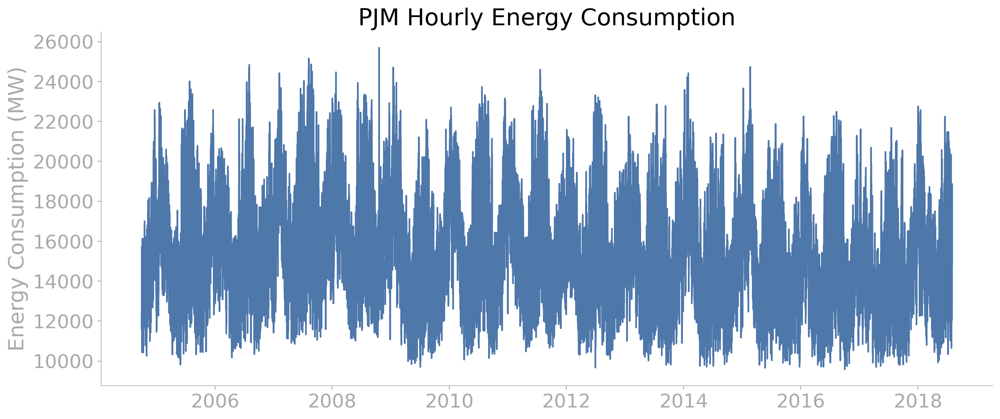

In [10]:
plt.figure(figsize=(15, 6), dpi=200)
plt.plot(df["Datetime_EST"], df["AEP_MW"], color=dark_blue)
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_color(light_grey)
plt.gca().spines["bottom"].set_color(light_grey)
plt.tick_params(axis="x", colors=dark_grey)
plt.tick_params(axis="y", colors=dark_grey)
plt.title("PJM Hourly Energy Consumption", fontsize=22)
plt.ylabel("Energy Consumption (MW)", fontsize=20, color=dark_grey)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(False)
plt.show()

It seems that the fluctuations align with the seasons, showing peaks in winter and summer, while decreasing during the other seasons. This is logical, given that the dataset pertains to energy consumption, and people typically use more energy during winter and summer because of extreme weather conditions.

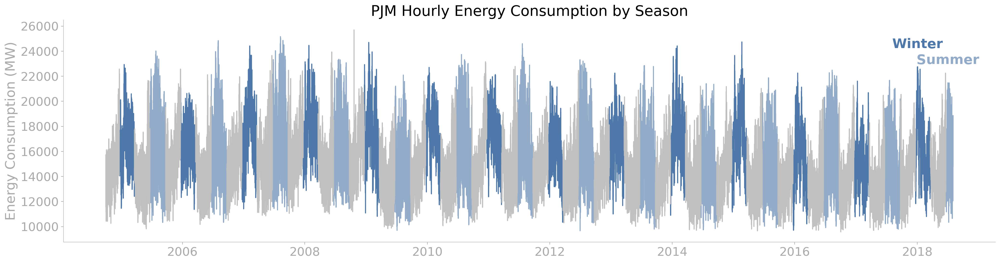

In [11]:
season_colors = {
    "Winter": dark_blue,
    "Summer": light_blue,
    "Autumn": light_grey,
    "Spring": light_grey
}

plt.figure(figsize=(25, 6), dpi=200)

def get_winter_year(date):
    return date.year if date.month < 12 else date.year + 1

for season, color in season_colors.items():
    temp_data = df[df["season"] == season].copy()

    if season == "Winter":
        temp_data["Winter_Year"] = temp_data["Datetime_EST"].map(get_winter_year)
        winter_years = temp_data["Winter_Year"].unique()

        for i, winter_year in enumerate(winter_years):
            year_data = temp_data[temp_data["Winter_Year"] == winter_year]

            if i > 0:
                plt.plot([year_data["Datetime_EST"].iloc[0], year_data["Datetime_EST"].iloc[0]], [np.nan, np.nan], color=color)

            plt.plot(year_data["Datetime_EST"], year_data["AEP_MW"], color=color, label=season if i == 0 else "")

    else:
        years = temp_data["Datetime_EST"].dt.year.unique()

        for i, year in enumerate(years):
            year_data = temp_data[temp_data["Datetime_EST"].dt.year == year]

            if i > 0:
                plt.plot([year_data["Datetime_EST"].iloc[0], year_data["Datetime_EST"].iloc[0]], [np.nan, np.nan], color=color)

            plt.plot(year_data["Datetime_EST"], year_data["AEP_MW"], color=color, label=season if i == 0 else "")

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)

plt.gca().spines["left"].set_color(light_grey)
plt.gca().spines["bottom"].set_color(light_grey)

plt.tick_params(axis="x", colors=dark_grey)
plt.tick_params(axis="y", colors=dark_grey)

plt.title("PJM Hourly Energy Consumption by Season", fontsize=22)
plt.ylabel("Energy Consumption (MW)", fontsize=20, color=dark_grey)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

for season, color in [("Winter", dark_blue), ("Summer", light_blue)]:
    temp_data = df[df["season"] == season].copy()

    if season == "Winter":
        temp_data["Winter_Year"] = temp_data["Datetime_EST"].map(get_winter_year)
        year_data = temp_data[temp_data["Winter_Year"] == temp_data["Winter_Year"].max()]
    else:
        year_data = temp_data[temp_data["Datetime_EST"].dt.year == temp_data["Datetime_EST"].dt.year.max()]

    max_point = year_data["Datetime_EST"].loc[year_data["AEP_MW"].idxmax()]
    max_value = year_data["AEP_MW"].max()

    plt.annotate(season, xy=(max_point, max_value), xytext=(max_point, max_value + 1500), ha="center", color=color, fontsize=20, fontweight="bold")

plt.grid(False)
plt.show()

Additionally, the hours of the day have an impact on the dataset. The data shows that energy consumption tends to be higher during work hours—specifically from 9 AM to 5 PM on weekdays (excluding national holidays)—compared to other times and weekends.

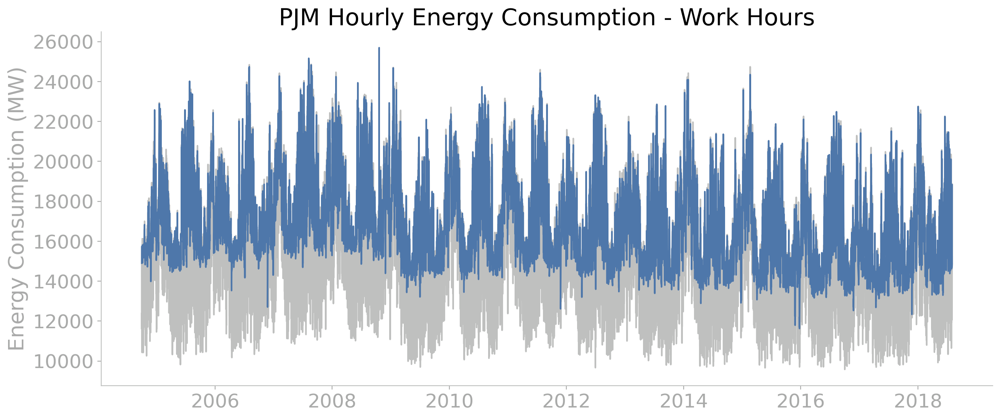

In [12]:
plt.figure(figsize=(15, 6), dpi=200)

workhours_data = df[df["is_workhours"]].copy()
non_workhours_data = df[~df["is_workhours"]].copy()

plt.plot(non_workhours_data["Datetime_EST"], non_workhours_data["AEP_MW"], color=light_grey)
plt.plot(workhours_data["Datetime_EST"], workhours_data["AEP_MW"], color=dark_blue)

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)

plt.gca().spines["left"].set_color(light_grey)
plt.gca().spines["bottom"].set_color(light_grey)

plt.tick_params(axis="x", colors=dark_grey)
plt.tick_params(axis="y", colors=dark_grey)

plt.title("PJM Hourly Energy Consumption - Work Hours", fontsize=22)
plt.ylabel("Energy Consumption (MW)", fontsize=20, color=dark_grey)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.grid(False)
plt.show()

# Time Series Analysis

## SARIMA

For the SARIMA analysis, I began by dividing the dataset into 80% for training and 20% for testing.

In [13]:
df_sarima_train, df_sarima_test = train_test_split(df, test_size=0.2, shuffle=False)

To assess the stationarity of our dataset, I employed the Dickey-Fuller test. The results indicated that the p-value is less than 5%, enabling us to reject the null hypothesis and conclude that our dataset is stationary.

In [14]:
adf = adfuller(df_sarima_train["AEP_MW"])

p_value = adf[1]
if p_value < 0.05:
    print("Reject the null hypothesis (H0). The data is stationary.")
else:
    print("Fail to reject the null hypothesis (H0). The data is not stationary.")

df_adf = pd.DataFrame({
    "ADF Statistic": [adf[0]],
    "p-value": [adf[1]],
    "Critical Value (1%)": [adf[4]["1%"]],
    "Critical Value (5%)": [adf[4]["5%"]],
    "Critical Value (10%)": [adf[4]["10%"]]
})
df_adf

Reject the null hypothesis (H0). The data is stationary.


,ADF Statistic,p-value,Critical Value (1%),Critical Value (5%),Critical Value (10%)
0,-14.551162,4.964265e-27,-3.430417,-2.86157,-2.566786


I applied Statsmodels' `seasonal_decompose` to break down our dataset. However, as anticipated, the plot becomes unclear due to the high density of data points, making it too packed to interpret easily.

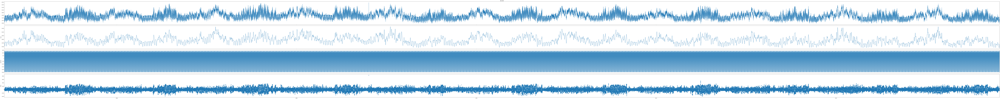

In [15]:
seasonal_decompose_result = seasonal_decompose(df_sarima_train["AEP_MW"], model="add")

fig = seasonal_decompose_result.plot()
fig.set_size_inches((200, 20))
fig.tight_layout()
plt.show()

Let’s focus on the seasonal plot using the first 55 rows. This allows us to clearly observe the seasonality in our data, which shows daily patterns. This is consistent with my earlier point that energy consumption is influenced by the hours of the day.

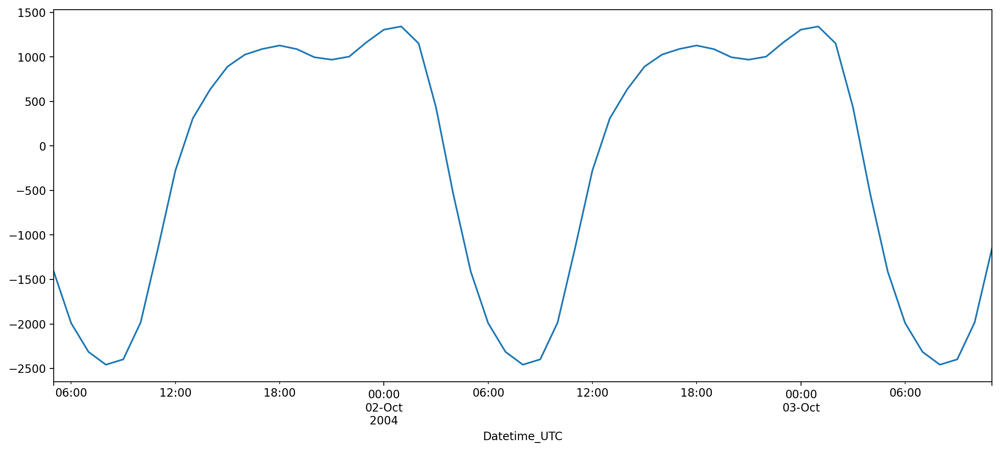

In [16]:
plt.figure(figsize=(15, 6), dpi=200)
seasonal_decompose_result.seasonal[:55].plot()
plt.show()

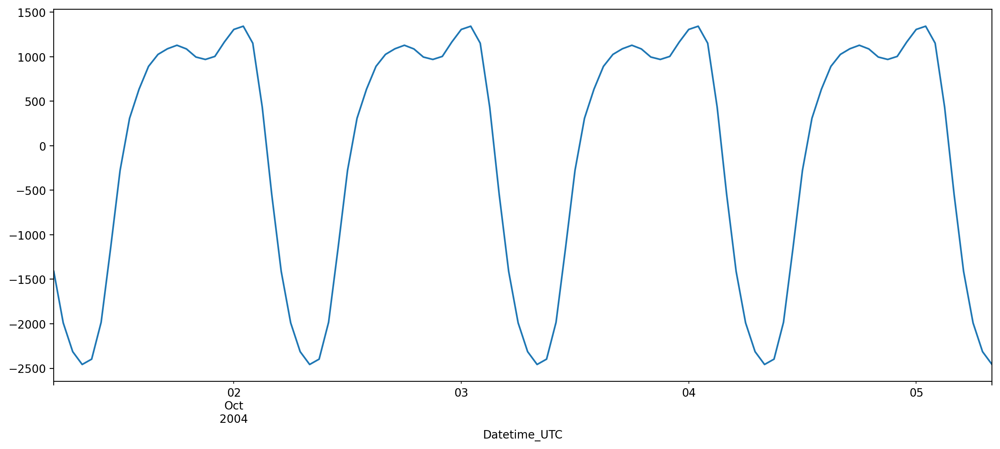

In [17]:
plt.figure(figsize=(15, 6), dpi=200)
seasonal_decompose_result.seasonal[:100].plot()
plt.show()

### Training

In the training phase, we can utilize `plot_acf` and `plot_pacf` to identify the optimal parameters for the SARIMA model. However, interpreting these plots can be challenging, especially with a large dataset, making them often inaccurate. As a result, I opted to use the `auto_arima` function to automatically determine the best SARIMA model.

Unfortunately, after attempting to fit three SARIMA models, my system crashed. This is likely due to the sheer size of the dataset. This also illustrates that while SARIMA can be very effective, its performance may diminish as the dataset becomes larger and more complex.

In [42]:
start_time = time.time()

sarima = auto_arima(df_sarima_train["AEP_MW"], seasonal=True, m=24, trace=True)

end_time = time.time()
duration_sarima = end_time - start_time

print(sarima.summary())
print(duration_sarima)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[24] intercept   : AIC=inf, Time=165.09 sec
 ARIMA(0,1,0)(0,0,0)[24] intercept   : AIC=1508406.669, Time=1.53 sec
 ARIMA(1,1,0)(1,0,0)[24] intercept   : AIC=inf, Time=212.80 sec


Even though we can't determine if it's the best model due to my system crashing, I decided to train one model to assess its performance. It's better than having no insights at all.

In [19]:
model = SARIMAX(df_sarima_train["AEP_MW"], order=(0,1,0), seasonal_order=(1, 0, 1, 24))
results = model.fit()
results.summary()

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.86801D+00    |proj g|=  4.64179D-02

At iterate    5    f=  6.83377D+00    |proj g|=  7.85653D-03

At iterate   10    f=  6.82957D+00    |proj g|=  4.65179D-04

At iterate   15    f=  6.82859D+00    |proj g|=  2.84751D-04

At iterate   20    f=  6.82810D+00    |proj g|=  1.29920D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     28      1     0     0   2.104D-07   6.828D+00
  F =   6.8280878806955272     

CONVERG

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                               AEP_MW   No. Observations:                97036
Model:             SARIMAX(0, 1, 0)x(1, 0, [1], 24)   Log Likelihood             -662570.336
Date:                              Sun, 22 Sep 2024   AIC                        1325146.671
Time:                                      23:21:57   BIC                        1325175.120
Sample:                                  10-01-2004   HQIC                       1325155.316
                                       - 10-27-2015                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L24       0.9965      0.000   5906.162      0.000       0.996       0.997
ma.S.L24      -0.8077      0.001   -680.792      0.000      -0.810      -0.805
sigma2      4.986e+04     38.125   1307.941      0.000    4.98e+04    4.99e+04
===================================================================================
Ljung-Box (L1) (Q):               28548.25   Jarque-Bera (JB):          19306866.98
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.88   Skew:                            -0.32
Prob(H) (two-sided):                  0.00   Kurtosis:                        72.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Evaluation

In [20]:
start=len(df_sarima_train)
end=len(df_sarima_train) + len(df_sarima_test) - 1
predictions = results.predict(start=start, end=end, dynamic=False, typ="levels").rename("(2,1,2)(1,0,1,24) Predictions")

Upon plotting the predictions and comparing them to the test dataset, it’s clear that SARIMA has underperformed. Its effectiveness seems to be limited by the dataset's size and complexity.

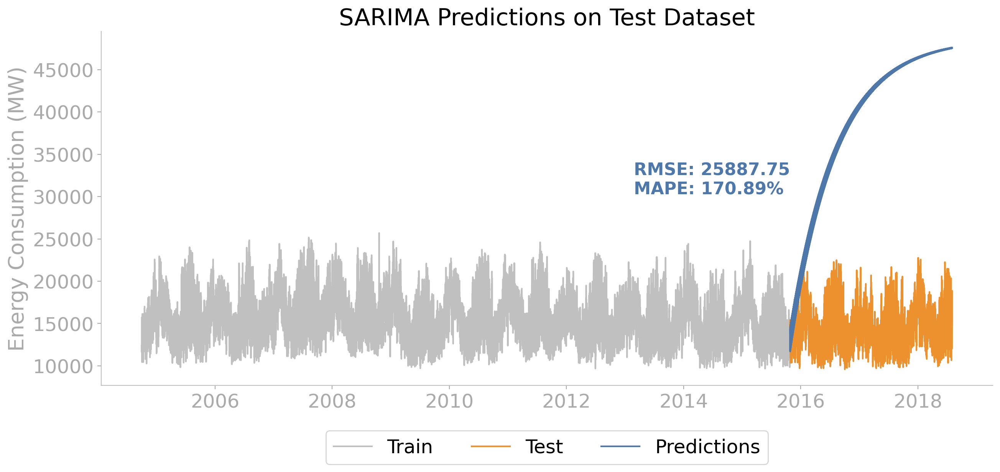

In [32]:
plt.figure(figsize=(15, 6), dpi=200)

plt.plot(df_sarima_train.index, df_sarima_train["AEP_MW"], color=light_grey, label="Train")
plt.plot(df_sarima_test.index, df_sarima_test["AEP_MW"], color=orange, label="Test")
plt.plot(predictions.index, predictions.values, color=dark_blue, label="Predictions")

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_color(light_grey)
plt.gca().spines["bottom"].set_color(light_grey)
plt.tick_params(axis="x", colors=dark_grey)
plt.tick_params(axis="y", colors=dark_grey)

plt.title("SARIMA Predictions on Test Dataset", fontsize=22)
plt.ylabel("Energy Consumption (MW)", fontsize=20, color=dark_grey)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.25), ncol=3, fontsize=18)

rmse_value = root_mean_squared_error(df_sarima_test["AEP_MW"], predictions.values)
mape_value = mean_absolute_percentage_error(df_sarima_test["AEP_MW"], predictions.values) * 100
plt.text(
    df_sarima_test.index.min(), 32000, 
    f"RMSE: {rmse_value:.2f}\nMAPE: {mape_value:.2f}%", 
    color=dark_blue,
    fontsize=16,
    ha="right",
    va="center",
    fontweight="bold",
    multialignment="left"
)

plt.grid(False)
plt.show()

## Meta's Prophet

Next, we’ll delve into a well-known forecasting model developed by Meta (formerly Facebook), called Prophet. It's celebrated for its ease of use and effective performance.

The approach will resemble that of SARIMA. We will train the Prophet model on our training dataset and then assess its performance using the testing dataset.

### Training

In [41]:
df_prophet = df[["AEP_MW"]].reset_index()
df_prophet.columns = ["ds", "y"]
df_prophet["ds"] = df_prophet["ds"].dt.tz_localize(None)
df_prophet.head()

,ds,y
0,2004-10-01 05:00:00,12379.0
1,2004-10-01 06:00:00,11935.0
2,2004-10-01 07:00:00,11692.0
3,2004-10-01 08:00:00,11597.0
4,2004-10-01 09:00:00,11681.0


In [42]:
df_prophet_train, df_prophet_test = train_test_split(df_prophet, test_size=0.2, shuffle=False)

In [43]:
start_time = time.time()

m = Prophet(daily_seasonality=True).add_country_holidays(country_name="US")
m.fit(df_prophet_train)

end_time = time.time()
duration_prophet = end_time - start_time

23:45:29 - cmdstanpy - INFO - Chain [1] start processing
23:46:10 - cmdstanpy - INFO - Chain [1] done processing


In [44]:
future = m.make_future_dataframe(periods=len(df_prophet_test), freq="h", include_history=False)

### Evaluation

In [45]:
forecast = m.predict(future)
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-10-27 09:00:00,15064.675476,10080.761229,14082.276707,15064.675476,15064.675476,0.0,0.0,0.0,0.0,...,696.410907,696.410907,696.410907,-1261.659190,-1261.659190,-1261.659190,0.0,0.0,0.0,12144.247814
1,2015-10-27 10:00:00,15064.664023,10724.925584,14454.236755,15064.664023,15064.664023,0.0,0.0,0.0,0.0,...,689.648055,689.648055,689.648055,-1259.044934,-1259.044934,-1259.044934,0.0,0.0,0.0,12603.066573
2,2015-10-27 11:00:00,15064.652569,11424.608241,15158.681695,15064.652569,15064.652569,0.0,0.0,0.0,0.0,...,680.914164,680.914164,680.914164,-1256.431944,-1256.431944,-1256.431944,0.0,0.0,0.0,13313.970199
3,2015-10-27 12:00:00,15064.641116,12251.901390,16058.944741,15064.641116,15064.641116,0.0,0.0,0.0,0.0,...,670.499585,670.499585,670.499585,-1253.820280,-1253.820280,-1253.820280,0.0,0.0,0.0,14108.916104
4,2015-10-27 13:00:00,15064.629662,12738.651710,16655.082334,15064.629662,15064.629662,0.0,0.0,0.0,0.0,...,658.695295,658.695295,658.695295,-1251.210000,-1251.210000,-1251.210000,0.0,0.0,0.0,14775.766596


Upon evaluation, it's evident that the Prophet model performs exceptionally well. It boasts a low RMSE and MAPE, with the MAPE being below 10%, which is typically considered an indicator of highly accurate forecasting.

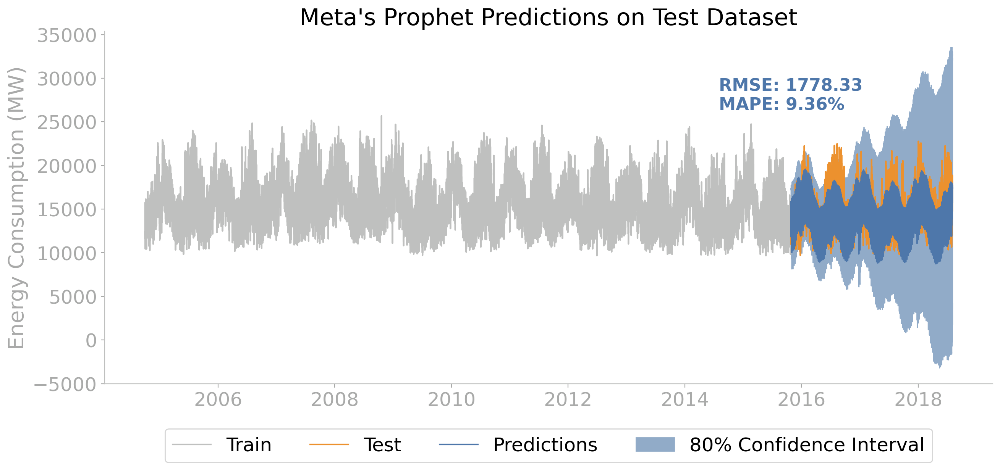

In [46]:
plt.figure(figsize=(15, 6), dpi=200)

plt.plot(df_prophet_train["ds"], df_prophet_train["y"], color=light_grey, label="Train")
plt.plot(df_prophet_test["ds"], df_prophet_test["y"], color=orange, label="Test")
plt.plot(forecast["ds"], forecast["yhat"], color=dark_blue, label="Predictions")
plt.fill_between(forecast["ds"], forecast["yhat_lower"], forecast["yhat_upper"], color=light_blue, label="80% Confidence Interval")

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_color(light_grey)
plt.gca().spines["bottom"].set_color(light_grey)
plt.tick_params(axis="x", colors=dark_grey)
plt.tick_params(axis="y", colors=dark_grey)

plt.title("Meta's Prophet Predictions on Test Dataset", fontsize=22)
plt.ylabel("Energy Consumption (MW)", fontsize=20, color=dark_grey)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.25), ncol=4, fontsize=18)

rmse_value = root_mean_squared_error(df_prophet_test["y"], forecast["yhat"])
mape_value = mean_absolute_percentage_error(df_prophet_test["y"], forecast["yhat"]) * 100
plt.text(
    df_prophet_test["ds"].min(), 28000, 
    f"RMSE: {rmse_value:.2f}\nMAPE: {mape_value:.2f}%", 
    color=dark_blue,
    fontsize=16,
    ha="center",
    va="center",
    fontweight="bold",
    multialignment="left"
)

plt.grid(False)
plt.show()

## Forecasting with the Best Model

Now that our Prophet model has shown satisfactory performance, we will retrain it on the complete dataset to make future forecasts.

In [48]:
m_full = Prophet(daily_seasonality=True).add_country_holidays(country_name="US")
m_full.fit(df_prophet)

23:47:51 - cmdstanpy - INFO - Chain [1] start processing
23:48:43 - cmdstanpy - INFO - Chain [1] done processing


In [50]:
future_periods = 6 * 30.5 * 24
future_full = m_full.make_future_dataframe(periods=int(future_periods), freq="h", include_history=False)

In [51]:
forecast_full = m_full.predict(future_full)

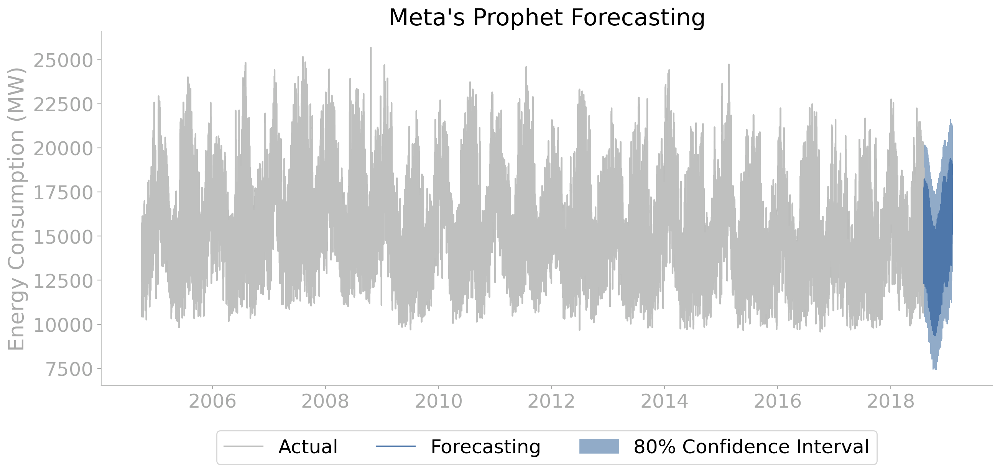

In [56]:
plt.figure(figsize=(15, 6), dpi=200)

plt.plot(df_prophet["ds"], df_prophet["y"], color=light_grey, label="Actual")
plt.plot(forecast_full["ds"], forecast_full["yhat"], color=dark_blue, label="Forecasting")
plt.fill_between(forecast_full["ds"], forecast_full["yhat_lower"], forecast_full["yhat_upper"], color=light_blue, label="80% Confidence Interval")

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_color(light_grey)
plt.gca().spines["bottom"].set_color(light_grey)
plt.tick_params(axis="x", colors=dark_grey)
plt.tick_params(axis="y", colors=dark_grey)

plt.title("Meta's Prophet Forecasting", fontsize=22)
plt.ylabel("Energy Consumption (MW)", fontsize=20, color=dark_grey)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.25), ncol=3, fontsize=18)

plt.grid(False)
plt.show()

As anticipated, our 6-month forecast suggests that energy consumption will likely peak during the summer (around August) and winter (around December). Interestingly, energy consumption is expected to stay elevated, with the possibility of further increases following December.

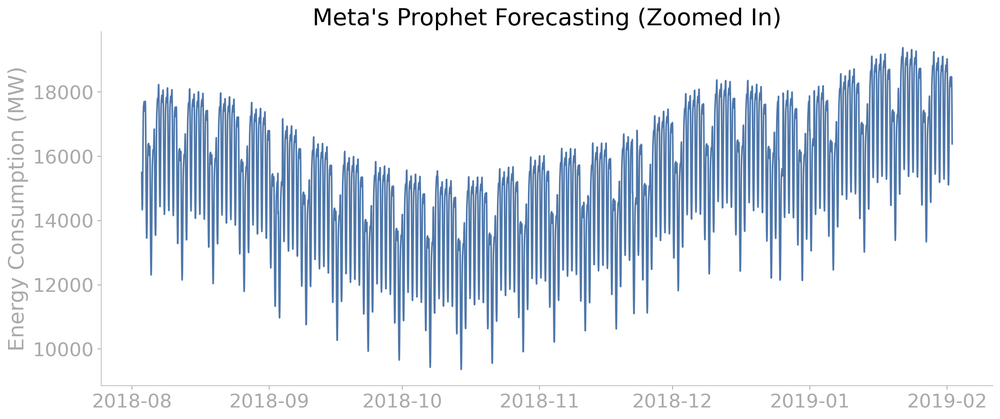

In [64]:
plt.figure(figsize=(15, 6), dpi=200)

# plt.plot(df_prophet["ds"], df_prophet["y"], color=light_grey, label="Actual")
plt.plot(forecast_full["ds"], forecast_full["yhat"], color=dark_blue, label="Forecasting")
# plt.fill_between(forecast_full["ds"], forecast_full["yhat_lower"], forecast_full["yhat_upper"], color=light_blue, label="80% Confidence Interval")

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_color(light_grey)
plt.gca().spines["bottom"].set_color(light_grey)
plt.tick_params(axis="x", colors=dark_grey)
plt.tick_params(axis="y", colors=dark_grey)

plt.title("Meta's Prophet Forecasting (Zoomed In)", fontsize=22)
plt.ylabel("Energy Consumption (MW)", fontsize=20, color=dark_grey)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.25), ncol=3, fontsize=18)

plt.grid(False)
plt.show()